# LAB 1| Advanced Data Cleaning. Numerical Data
For this lab, we will be using the dataset in the Customer Analysis Business Case. This dataset can be found in `files_for_lab` folder.

## Context

An auto insurance company has collected some data about its customers including their _demographics_, _education_, _employment_, _policy details_, _vehicle information_ on which insurance policy is, and _claim amounts_. You will help the senior management with some business questions that will help them to better understand their customers, improve their services, and improve profitability.

**Some business Objectives**:

- Retain customers,
- Analyze relevant customer data,
- Develop focused customer retention programs.

Based on the analysis, take targeted actions to increase profitable customer response, retention, and growth.

### Instructions

1. Import the necessary libraries.
2. Load the `we_fn_use_c_marketing_customer_value_analysis.csv` into the variable `customer_df`.
3. First look at its main features (`head`, `shape`, `info`).
4. Rename the columns so they follow the _PE8_ (snake case).
5. Change effective to date column to datetime format.
6. Check `NaN` values per column.
7. Define a function that differentiates between continuous and discrete variables. **Hint**: A number of unique values might be useful. Store continuous data into a `continuous` variable and do the same for `discrete` and categorical.
8. For the categorical data, check if there is some kind of text in a variable so we would need to clean it. **Hint**: Use the same method you used in step 7. Depending on the implementation, decide what to do with the variables you get.
9. Get categorical features.
10. What should we do with the `customer_id` column?



In [1]:
# import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

# Ensure all pd cells are viewable.
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
# load data into a pandas dataframe
customer_data = pd.read_csv('we_fn_use_c_marketing_customer_value_analysis.csv')
customer_data.shape
customer_data.head()


,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [3]:
# View information about the data.
customer_data.info
customer_data.describe()

,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount
count,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000
mean,8004.940475,37657.380009,93.219291,15.097000,48.064594,0.384388,2.966170,434.088794
std,6870.967608,30379.904734,34.407967,10.073257,27.905991,0.910384,2.390182,290.500092
min,1898.007675,0.000000,61.000000,0.000000,0.000000,0.000000,1.000000,0.099007
25%,3994.251794,0.000000,68.000000,6.000000,24.000000,0.000000,1.000000,272.258244
50%,5780.182197,33889.500000,83.000000,14.000000,48.000000,0.000000,2.000000,383.945434
75%,8962.167041,62320.000000,109.000000,23.000000,71.000000,0.000000,4.000000,547.514839
max,83325.381190,99981.000000,298.000000,35.000000,99.000000,5.000000,9.000000,2893.239678


In [4]:
# Rename column headers to follow _PE8_ (snake case) convention.
customer_data.columns
new_headers = ['Customer', 'State', 'Customer Lifetime Value', 'Response', 'Coverage',
       'Education', 'Effective To Date', 'EmploymentStatus', 'Gender',
       'Income', 'Location Code', 'Marital Status', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies', 'Policy Type',
       'Policy', 'Renew Offer Type', 'Sales Channel', 'Total Claim Amount',
       'Vehicle Class', 'Vehicle Size']
# define function to rename headers.
import re

def snake_moder(x):
    x = x.lower()
    x = re.sub('\s', '_', x)
    return x

headers = list(map(snake_moder, new_headers))
customer_data.columns = headers

In [5]:
# Change effective_to_date column to datetime format.
customer_data['effective_to_date'] = pd.to_datetime(customer_data['effective_to_date'])
customer_data['effective_to_date'].head()

0   2011-02-24
1   2011-01-31
2   2011-02-19
3   2011-01-20
4   2011-02-03
Name: effective_to_date, dtype: datetime64[ns]

In [6]:
# Check NaN Values per column.
NaN_sums = customer_data.isnull().sum()
NaN_percent = customer_data.isna().sum()/len(customer_data)
NaN_sums
NaN_percent

customer                         0.0
state                            0.0
customer_lifetime_value          0.0
response                         0.0
coverage                         0.0
education                        0.0
effective_to_date                0.0
employmentstatus                 0.0
gender                           0.0
income                           0.0
location_code                    0.0
marital_status                   0.0
monthly_premium_auto             0.0
months_since_last_claim          0.0
months_since_policy_inception    0.0
number_of_open_complaints        0.0
number_of_policies               0.0
policy_type                      0.0
policy                           0.0
renew_offer_type                 0.0
sales_channel                    0.0
total_claim_amount               0.0
vehicle_class                    0.0
vehicle_size                     0.0
dtype: float64

In [7]:
# Define a function that differentiates between continuous and discrete variables.

def variable_check(df):
    discrete = []
    continuous = []
    categorical = []
    pattern = '[a-z]*'
    for column in df.columns:
        if df[column].dtype == 'int64' and len(df[column].unique())/len(df[column]) > 0.05 or df[column].dtype == 'float64'and len(df[column].unique())/len(df[column]) > 0.05 :
            continuous.append(column)
        elif df[column].dtype == 'int64' and len(df[column].unique())/len(df[column]) < 0.05 or df[column].dtype == 'float64'and len(df[column].unique())/len(df[column]) < 0.05:
            discrete.append(column)
        else:
            categorical.append(column)
    return  continuous, discrete, categorical

continuous,discrete,categorical = variable_check(customer_data)
display(continuous)
display(discrete)
display(categorical)

['customer_lifetime_value', 'income', 'total_claim_amount']

['monthly_premium_auto',
 'months_since_last_claim',
 'months_since_policy_inception',
 'number_of_open_complaints',
 'number_of_policies']

['customer',
 'state',
 'response',
 'coverage',
 'education',
 'effective_to_date',
 'employmentstatus',
 'gender',
 'location_code',
 'marital_status',
 'policy_type',
 'policy',
 'renew_offer_type',
 'sales_channel',
 'vehicle_class',
 'vehicle_size']

In [8]:
# create data frame of continuous variables
customer_continuous = customer_data[continuous]
display(customer_continuous.head())
# create dataframe of discrete variables
customer_discretes = customer_data[discrete]
display(customer_discretes.head())

,customer_lifetime_value,income,total_claim_amount
0,2763.519279,56274,384.811147
1,6979.535903,0,1131.464935
2,12887.431650,48767,566.472247
3,7645.861827,0,529.881344
4,2813.692575,43836,138.130879


,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies
0,69,32,5,0,1
1,94,13,42,0,8
2,108,18,38,0,2
3,106,18,65,0,7
4,73,12,44,0,1


In [9]:
# create a dataframe of categorical variables
customer_categoricals = customer_data[categorical]
customer_categoricals.head()

,customer,state,response,coverage,education,effective_to_date,employmentstatus,gender,location_code,marital_status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,BU79786,Washington,No,Basic,Bachelor,2011-02-24,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,Bachelor,2011-01-31,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,Bachelor,2011-02-19,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,Bachelor,2011-01-20,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,Bachelor,2011-02-03,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize


In [10]:
# What should be done with the 'customer_id' column?

- The customer_id column should only be used to ensure that we do not have redundant data for the same customer ids.  
- If there are no duplicate entries for the same customer ids, we can assume that each row is a unique record.
- Therefore we can drop the customer_id column as it should not serve any further purpose for our analysis.  

# Lab 2 | Cleaning categorical data

For this lab, we will be using the dataset in the Customer Analysis Business Case. This dataset can be found in `files_for_lab` folder. In this lab we will explore categorical data.

### Instructions

1. Import the necessary libraries if you are starting a new notebook.
2. Load the continuous and discrete variables into `continuous_df` and `discrete_df` variables.
3. Plot a correlation matrix, what can you see?
4. Create a function to plot every discrete variables. Do the same with continuous variables (be careful, you may change the plot type to another one better suited for continuous data).
5. What can you see in the plots?
6. Look for outliers in the continuous variables we have found. Hint: There was a good plot to do that.
7. Have you found outliers? If you have, what should we do with them?
8. Check nan values per column.
9. Define a function that differentiate between continuous and discrete variables. Hint: Number of unique values might be useful. Store continuous data into a `continuous` variable and do the same for `discrete` and categorical.
10. for the categorical data, check if there is some kind of text in a variable so we would need to clean it. Hint: Use the same method you used in step 7. Depending on the implementation, decide what to do with the variables you get.
11. Get categorical features.
12. What should we do with the customer id column?


In [11]:
# Load continuous features into continuous_df dataframe
continuous_df = customer_continuous

# Load discrete features into discrete_df dataframe
discrete_df = customer_discretes

<AxesSubplot:>

<AxesSubplot:>

<AxesSubplot:>

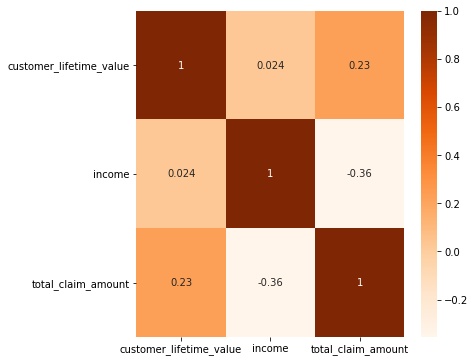

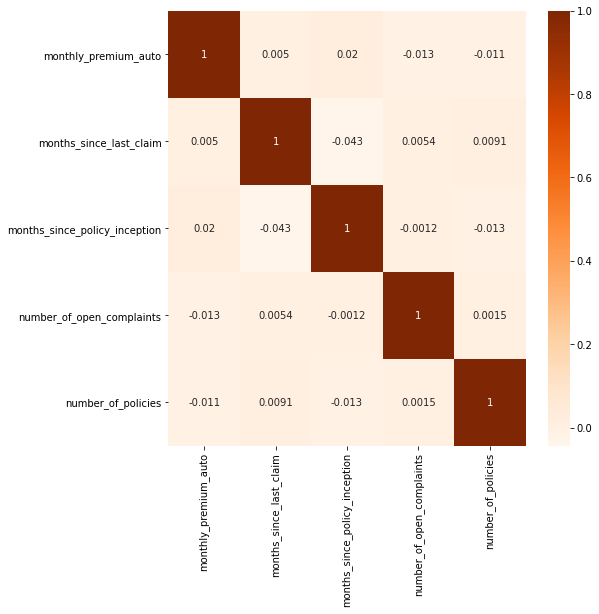

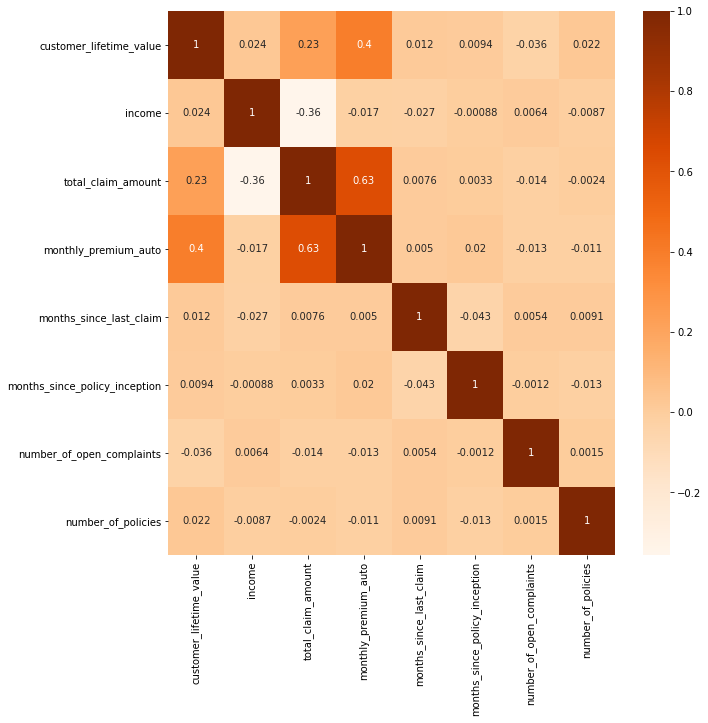

In [12]:
# Define a function to plot a correlation matrix and visualize correlation matrices as heatmaps
def heatmapper(dataframe, size = (20,20)):
    fig = plt.figure(figsize= size)
    correlation_matrix = dataframe.corr()
    heatmap = sns.heatmap(correlation_matrix, cmap = 'Oranges', annot=True)
    return heatmap

numerical_df = pd.concat([continuous_df,discrete_df], axis = 1) 

heatmap1 = heatmapper(continuous_df, size = (6,6))
heatmap2 = heatmapper(discrete_df, size = (8,8))
heatmap3 = heatmapper(numerical_df, size = (10,10))
display(heatmap1)
display(heatmap2)
display(heatmap3)


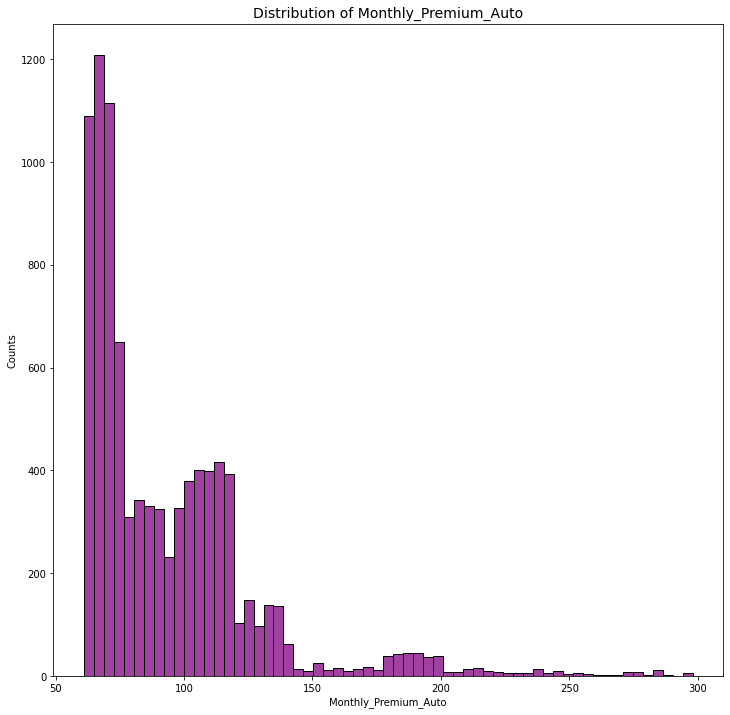

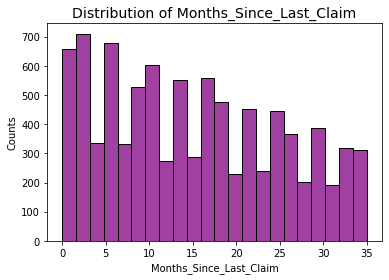

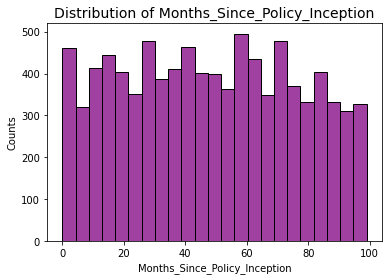

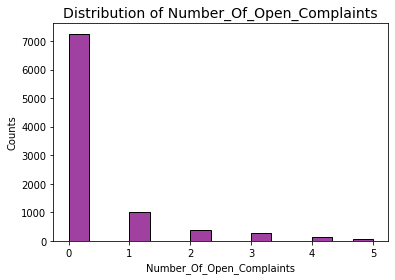

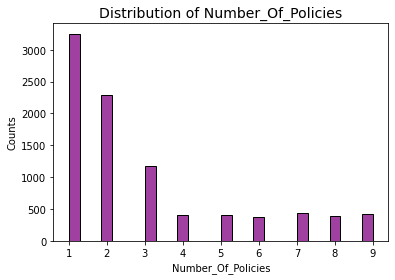

In [13]:
#Create a function to plot every discrete variables.

def discrete_plotter(df, size = (8,8)):
    fig = plt.figure(figsize= size)
    for feature in df.columns:    # define plot figure
        fig = plt.figsize = size
    # define the type and styling of plot
        sns.histplot( df[feature], color = 'purple')
        plt.ylabel('Counts')
        plt.xlabel(f'{feature.title()}')
        plt.title(f'Distribution of {feature.title()}', fontsize = 14)
        plt.show()

discrete_plotter(discrete_df, size = (12,12))

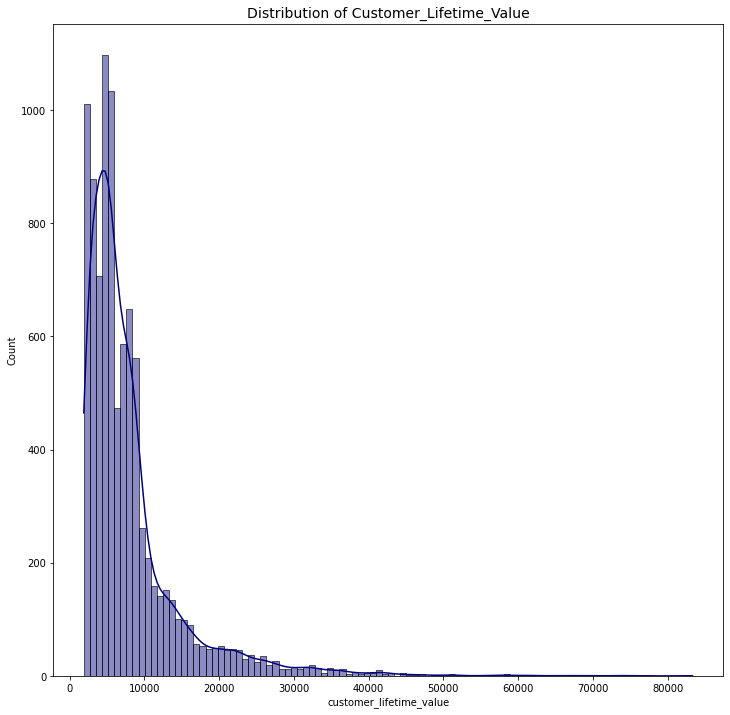

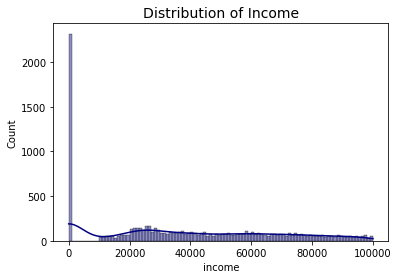

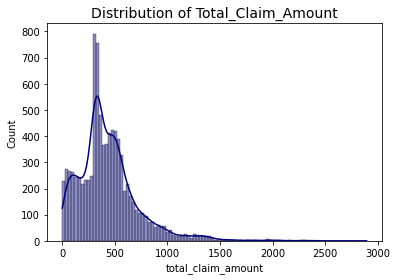

In [14]:
def continuous_hist_plotter(df, size = (8,8), bins = 10):
    fig = plt.figure(figsize= size)
    for feature in df.columns:    # define plot figure
        fig = plt.figsize = size
    # define the type and styling of plot
        sns.histplot(df[feature], kde= True, color = 'Navy',alpha = 0.45, bins = bins)
        plt.title(f'Distribution of {feature.title()}', fontsize = 14)
        plt.show()

continuous_hist_plotter(continuous_df, size = (12,12), bins = 100)

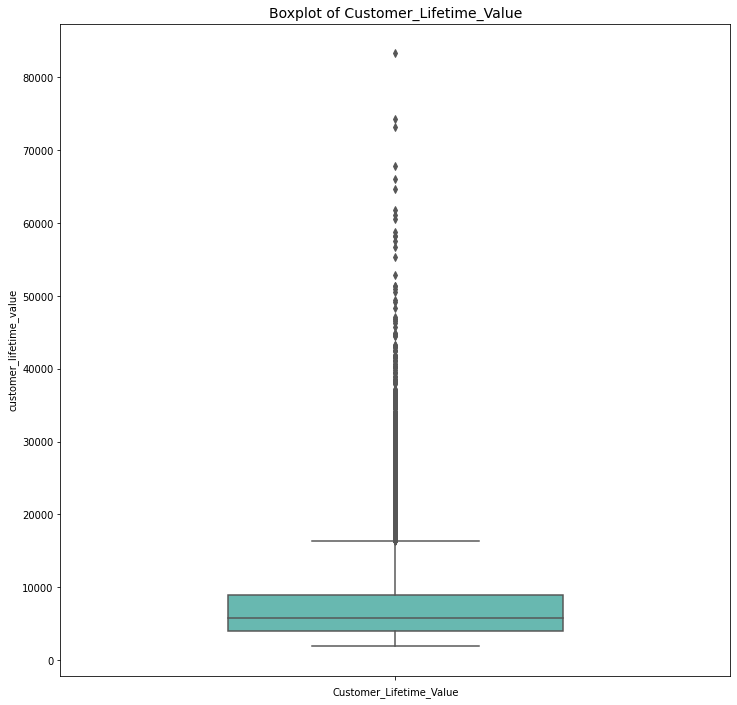

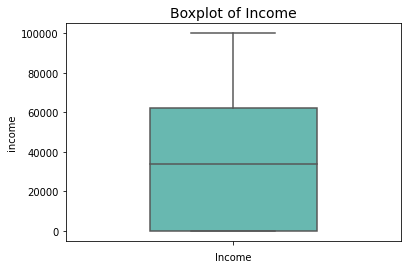

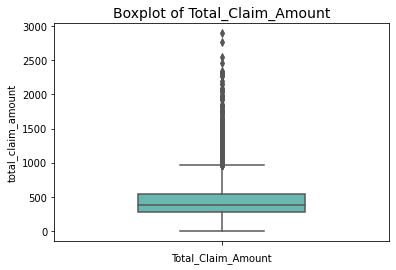

In [15]:
def continuous_boxplotter(df, size = (8,8)):
    fig = plt.figure(figsize= size)
    for feature in df.columns:    # define plot figure
        fig = plt.figsize = size
    # define the type and styling of plot
        sns.boxplot(y = df[feature], orient= 'v', color = 'turquoise', saturation=0.5, width=0.5 )
        plt.xlabel(f'{feature.title()}')
        plt.title(f'Boxplot of {feature.title()}', fontsize = 14)
        plt.show()

continuous_boxplotter(continuous_df, size = (12,12))

In [16]:
# Considering the number of outliers in the Total_Claim_Amount and Customer_lifetime_value columns, it might be a good idea to 
# to apply a log transformation on the data to reduce the skewing of the data.

# define a function to transform each value in a series to its respective log.
from math import log

def log_transformer(x):
    if np.isfinite(x) and x != 0:
        x = np.log(x)
        return x
    else:
        x = 0
        return x

for column in continuous_df.columns:
    continuous_df[column] = continuous_df[column].apply(lambda x: log_transformer(x))

continuous_df.head()




C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


,customer_lifetime_value,income,total_claim_amount
0,7.924260,10.937988,5.952753
1,8.850738,0.000000,7.031268
2,9.464008,10.794809,6.339428
3,8.941920,0.000000,6.272653
4,7.942253,10.688211,4.928202


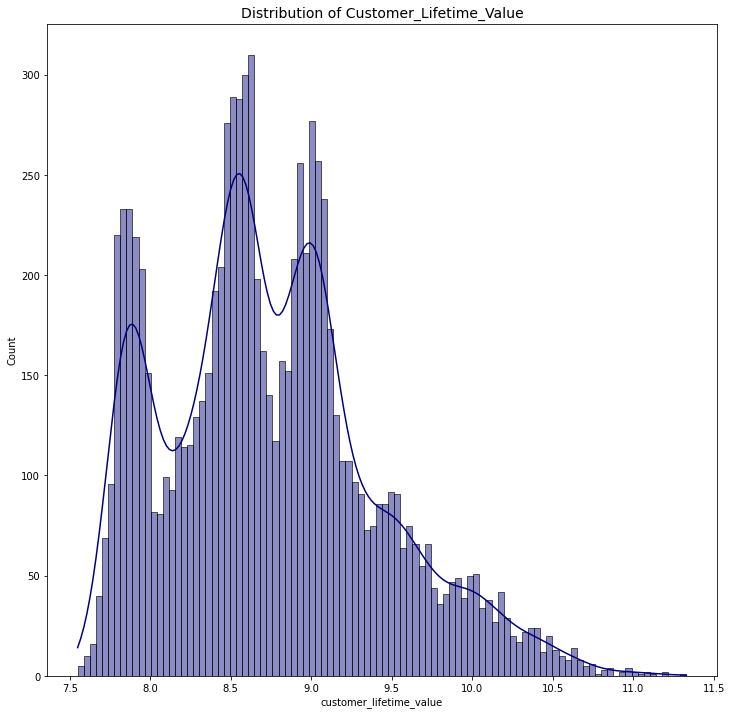

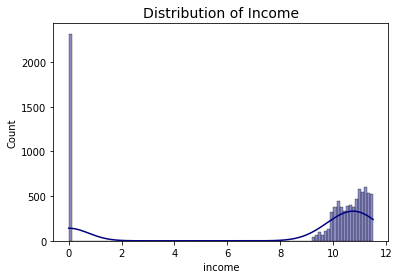

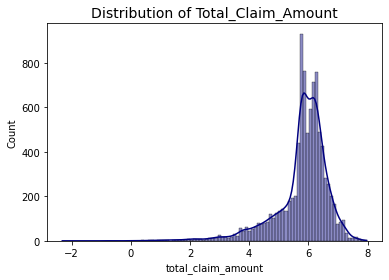

In [17]:
continuous_hist_plotter(continuous_df, size = (12,12), bins = 100)

In [18]:
# limit data by interquartile ranges


In [19]:
# define function to determine the upper limit of distribution.

def iqr_decap(series):
    col_iqr = np.percentile(series,75) - np.percentile(series,25)
    col_iqr_upper_limit = np.percentile(series,75) + col_iqr*1.5
    return col_iqr_upper_limit

# define function to remove values over the upper limit
def outlier_counter(x,iqr_upper_limit):
    iqr_upper_limit
    if x < 0 or  x > iqr_upper_limit:
        return np.NaN
    else:
        return x

# apply functions
clv = iqr_decap(continuous_df['customer_lifetime_value'])
tca = iqr_decap(continuous_df['total_claim_amount'])
inc = iqr_decap(continuous_df['income'])

CLV = continuous_df['customer_lifetime_value'].apply(lambda x: outlier_counter(x,clv))
TCA = continuous_df['total_claim_amount'].apply(lambda x: outlier_counter(x,tca))
INC = continuous_df['income'].apply(lambda x: outlier_counter(x,inc))


In [20]:
# count outliers ( not coded as NaNs)
CLV.isna().sum()
TCA.isna().sum()
#INC.isna().sum()

63

In [21]:
# Drop outliers


In [22]:
# concatenate the dataframes and drop the rows with NaN Values.
continuous_df_cut = pd.concat([CLV,TCA,INC], axis = 1)
display(continuous_df_cut.shape)
# continuous_df_cut.dropna(axis = 0,inplace = True)
# display(continuous_df_cut.shape)

(9134, 3)

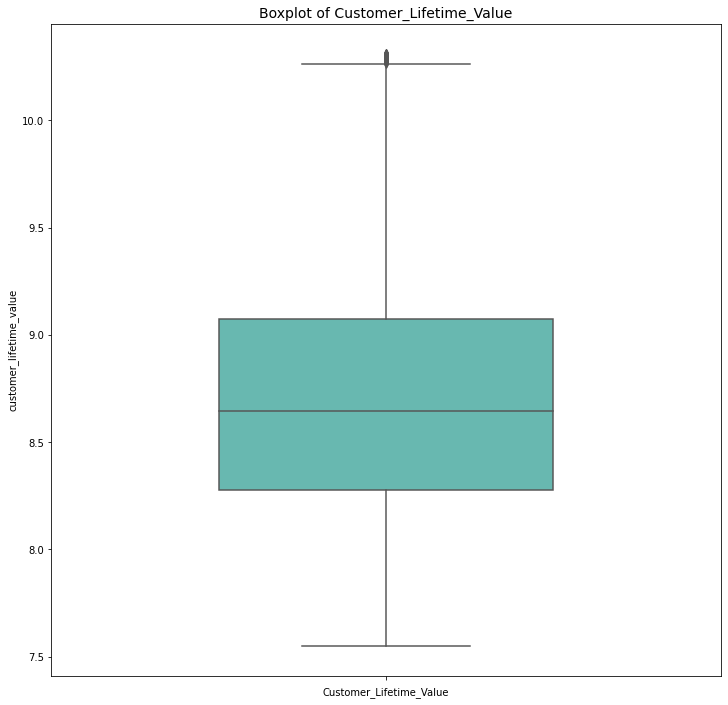

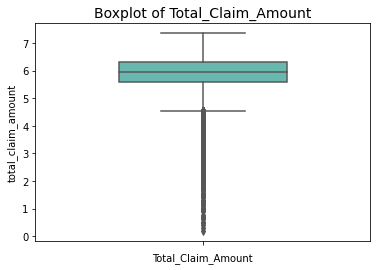

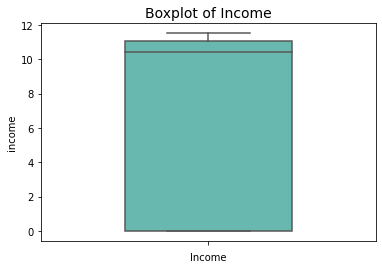

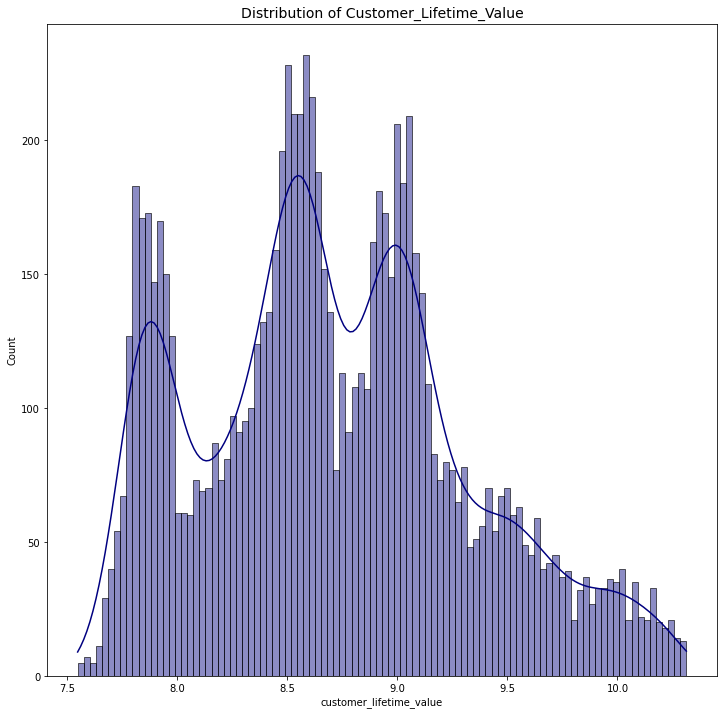

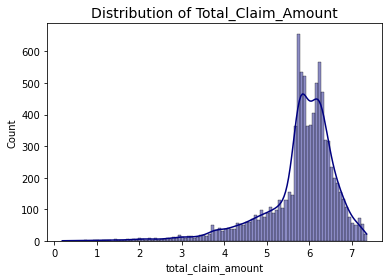

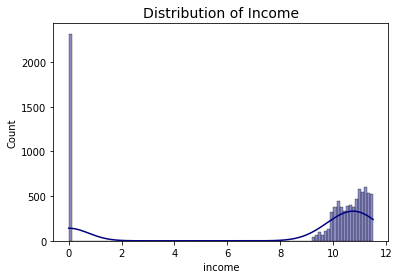

In [23]:
# visualize data with outliers removed.
continuous_boxplotter(continuous_df_cut, size = (12,12))
continuous_hist_plotter(continuous_df_cut, size = (12,12), bins = 100)

# Lab 3 | Feature extraction

For this lab, we will be using the same dataset we used in the previous labs. We recommend using the same notebook since you will be reusing the same variables you previous created and used in labs. 

### Instructions

1. Open the `categoricals` variable we created before.

```python
categoricals = data.select_dtypes(np.object)
categoricals.head()
```

2. Plot all the categorical variables with the proper plot. What can you see?
3. There might be some columns that seem to be redundant, check their values to be sure. What should we do with them?
4. Plot time variable. Can you extract something from it?



In [24]:
# define the categorical data dataframe
categoricals = customer_data[categorical]
categoricals.head()

,customer,state,response,coverage,education,effective_to_date,employmentstatus,gender,location_code,marital_status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,BU79786,Washington,No,Basic,Bachelor,2011-02-24,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,Bachelor,2011-01-31,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,Bachelor,2011-02-19,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,Bachelor,2011-01-20,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,Bachelor,2011-02-03,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize


In [25]:
# 1. Define functions for consolidating categorical data with (likely) redundant categories.
# 2. Clean the categorical data.

In [26]:
def education_comb(x):
    # Assuming College and Bachelor refer to clients who have either a college level or bachelor level education
    if x == 'Bachelor' or x == 'College':
        x = 'Undergraduate'
        return x
    # Grouping Graduate and Post-Graduate into a single category    
    elif x == 'Master' or x == 'Doctor':
        x = 'PostGraduate'
        return x
    else:
        x = 'High School or Below'
        return x


categoricals['education'] = categoricals['education'].apply(lambda x: education_comb(x))

categoricals['education'].value_counts()





C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


Undergraduate           5429
High School or Below    2622
PostGraduate            1083
Name: education, dtype: int64

In [27]:
def employment_comb(x):
    # Owing to the smaller numbers of Medical Leave, Disabled and Retired, it might be a good choice
    # to consolidate these into a single category.
    if x != 'Employed' and x != 'Unemployed':
        x = 'Other'
        return x
    else:
        return x

categoricals['employment_status'] = categoricals['employmentstatus'].apply(lambda x: employment_comb(x))
categoricals['employment_status'].value_counts()

Employed      5698
Unemployed    2317
Other         1119
Name: employment_status, dtype: int64

In [28]:
def policy_comb(x):
    # Policy type determines the demographic for which a given policy is taken out.
    # The actual policy as represented by L1,L2 or L3 provides a greater representation of the value associated with the given policy.
    policy_type = x.split(' ')[1]
    if policy_type == 'L1':
        x = 'L1'
    elif policy_type == 'L2':
        x = 'L2'
    else:
        x = 'L3'
    return x

# As there is already a column that contains the policy_type, it may not be necessary to transform the policy column
# by consolidating the L1,L2 and L3 policies.
# Instead, if there is strong evidence of dependency between the policy and policy_type columns, it might be a 
# better idea to drop the policy_type column and retain the policy column. 



In [29]:
def car_class_comb(x):
    # as vehicles in the class 'Luxury' can be considered as high-end, Sports cars can likely
    # be consolidated in this group as well.
    if x in ['Sports Car','Luxury SUV','Luxury Car']:
        x = 'Luxury Vehicle'
    else:
        x = x
    return x

categoricals['vehicle_class'] = categoricals['vehicle_class'].apply(lambda x: car_class_comb(x))
categoricals['vehicle_class'].value_counts()  



Four-Door Car     4621
Two-Door Car      1886
SUV               1796
Luxury Vehicle     831
Name: vehicle_class, dtype: int64

In [30]:
# Extract usable information from 'effective_to_date'
categoricals['Day'] = categoricals['effective_to_date'].dt.dayofweek
categoricals['Month'] = categoricals['effective_to_date'].dt.month
categoricals['Year'] = categoricals['effective_to_date'].dt.year

# check
categoricals['DayofWeek'] = categoricals['Day'].map({0:"Sunday",1:"Monday",2:"Tuesday",3:"Wednesday",4:"Thursday",5:"Friday",6:"Saturday"})
# categoricals['Month'].value_counts()
# categoricals['Year'].value_counts()
# Of these month and day may be most useful.
categoricals['DayofWeek'].unique()

array(['Wednesday', 'Sunday', 'Friday', 'Monday', 'Tuesday', 'Saturday',
       'Thursday'], dtype=object)

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


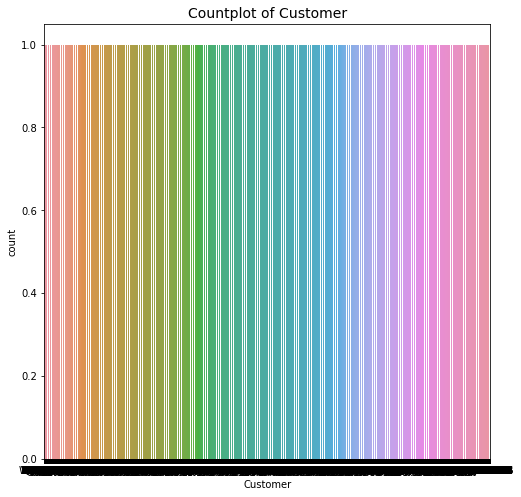

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


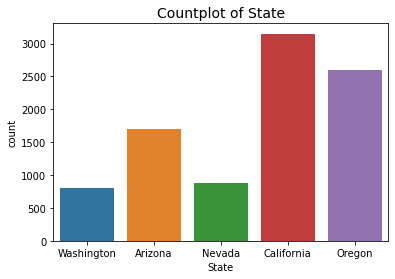

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


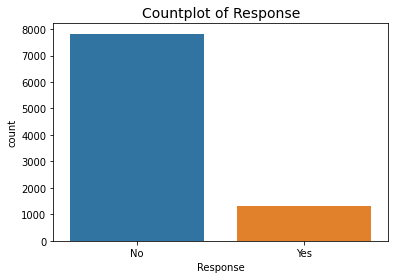

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


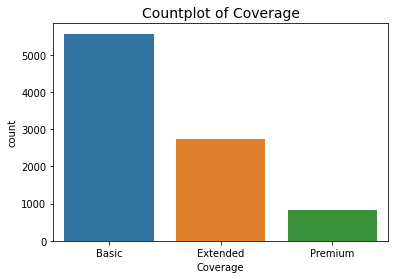

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


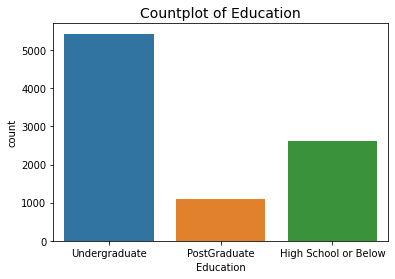

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


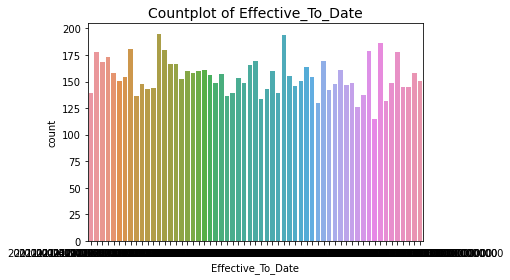

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


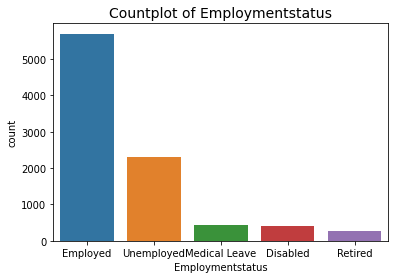

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


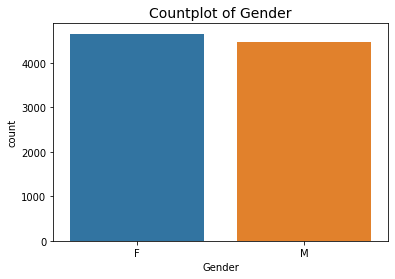

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


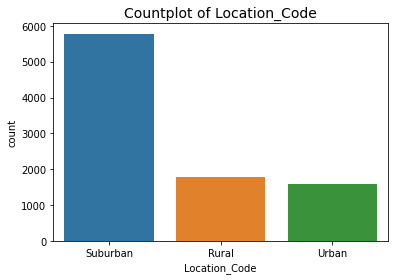

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


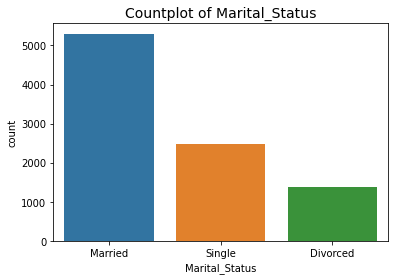

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


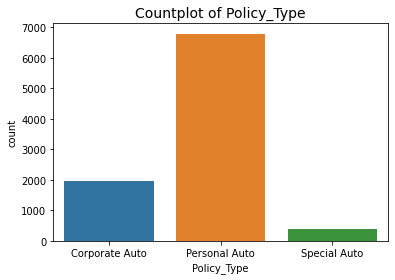

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


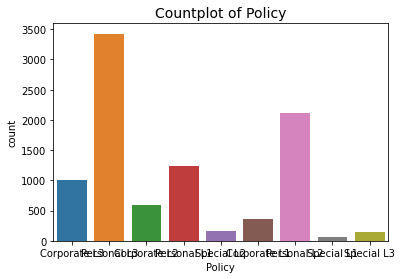

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


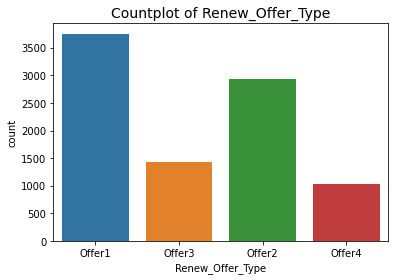

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


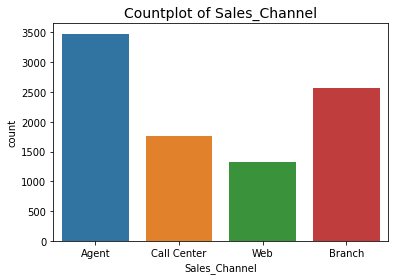

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


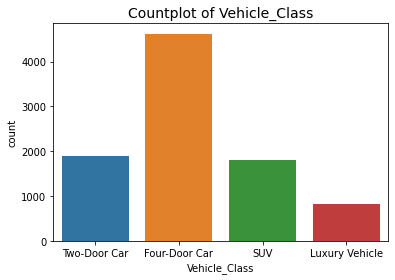

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


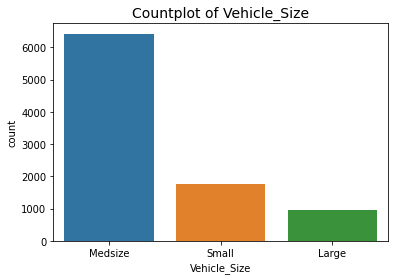

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


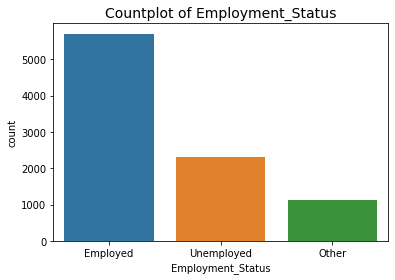

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


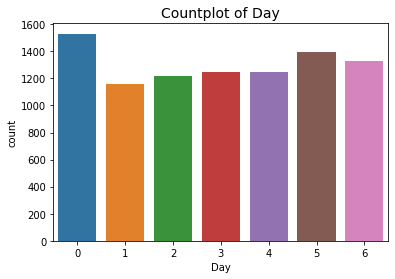

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


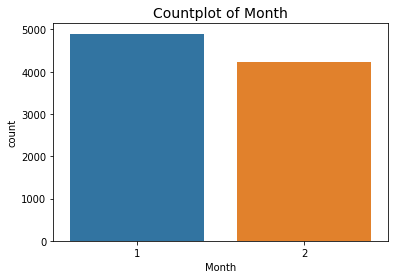

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


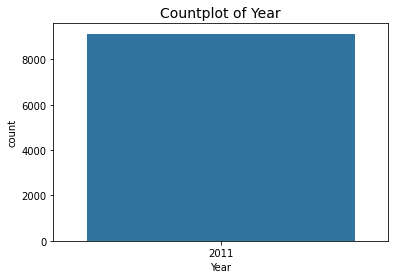

C:\Users\Ish\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


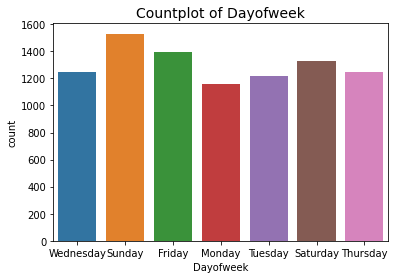

In [31]:
# Plot the categorical variables with the appropriate plot.

def cat_plotter(df, size = (8,8) ):
    fig = plt.figure(figsize= size)
    for feature in df.columns:    # define plot figure
        fig = plt.figsize = size
    # define the type and styling of plot
        sns.countplot(df[feature])
        plt.xlabel(f'{feature.title()}')
        plt.title(f'Countplot of {feature.title()}', fontsize = 14)
        plt.show()

cat_plotter(categoricals)

# Lab | Data cleaning and wrangling

For this lab, we will be using the same dataset we used in the previous labs. We recommend using the same notebook since you will be reusing the same variables you previous created and used in labs. 

### Instructions

So far we have worked on `EDA`. This lab will focus on data cleaning and wrangling from everything we noticed before.

1. We will start with removing outliers. So far, we have discussed different methods to remove outliers. Use the one you feel more comfortable with, define a function for that. Use the function to remove the outliers and apply it to the dataframe.
2. Create a copy of the dataframe for the data wrangling.
3. Normalize the continuous variables. You can use any one method you want.
4. Encode the categorical variables
5. The time variable can be useful. Try to transform its data into a useful one. Hint: Day week and month as integers might be useful.
6. Since the model will only accept numerical data, check and make sure that every column is numerical, if some are not, change it using encoding.

**Hint for Categorical Variables**

- You should deal with the categorical variables as shown below (for ordinal encoding, dummy code has been provided as well):

```python
# One hot to state
# Ordinal to coverage
# Ordinal to employmentstatus
# Ordinal to location code
# One hot to marital status
# One hot to policy type
# One hot to policy
# One hot to renew offercustomer_df
# One hot to sales channel
# One hot vehicle class
# Ordinal vehicle size

data["coverage"] = data["coverage"].map({"Basic" : 0, "Extended" : 1, "Premium" : 2})
# given that column "coverage" in the dataframe "data" has three categories:
# "basic", "extended", and "premium" and values are to be represented in the same order.
```


In [32]:
continuous_df.shape
discrete_df.shape
categoricals.shape

(9134, 21)

In [67]:
# Encode categorical features.

# define a function to create a OneHotEncoder for individual features
from sklearn.preprocessing import OneHotEncoder

def One_Hotter(df):
    # create encoder object
    OH_encoder = OneHotEncoder().fit(df)
    #create header list
    category_columns = []
    for columns in df.columns:
        for column_header in df[columns].unique():
            category_columns.append(column_header)
    # encode training data and re-assign result as dataframe with column names
    df_encoded = OH_encoder.transform(df).toarray()      
    df_encoded = pd.DataFrame(df_encoded, columns = category_columns)
    # return the encoded datas frames
    return df_encoded

# encode columns 'state', 'marital_status', 'policy','policy_type', 'renew_offer', 'sales_channel','vehicle_size', 'vehicle_class'
state = pd.DataFrame(categoricals['state'])
state_encoded = One_Hotter(state)

marital = pd.DataFrame(categoricals['marital_status'])
marital_encoded = One_Hotter(marital)

policy = pd.DataFrame(categoricals['policy'])
policy_encoded = One_Hotter(policy)

policy_type = pd.DataFrame(categoricals['policy'])
policy_type_encoded = One_Hotter(policy)

renew = pd.DataFrame(categoricals['renew_offer_type'])
renew_encoded = One_Hotter(renew)

channel = pd.DataFrame(categoricals['sales_channel'])
channel_encoded = One_Hotter(channel)

v_class = pd.DataFrame(categoricals['vehicle_class'])
v_class_encoded = One_Hotter(v_class)



In [66]:
# One hot to state
# Ordinal to coverage
# Ordinal to employmentstatus
# Ordinal to location code
# One hot to marital status
# One hot to policy type
# One hot to policy
# One hot to renew offercustomer_df
# One hot to sales channel
# One hot vehicle class
# Ordinal vehicle size

coverage_ordinal = categoricals["coverage"].map({"Basic" : 0, "Extended" : 1, "Premium" : 2})

employmentstatus_ordinal = categoricals["employmentstatus"].map({'Unemployed':0, 'Other':1, 'Employed':2})
# we code Unemployed as 0 ordinally, as we can assume that unemployed clients have lower income, whereas
# clients in the Other category may still have some form of income (Pension for Retirees, medical/disability assistance etc.)
# Unemployed is coded as 2, as we can assume that this will be the highest income group.

location_code_ordinal = categoricals["location_code"].map({"Suburban":1,"Urban":2,"Rural":0})
# Considering the proximity to cities or urban centers as a possible predictor we will encode the Rural,Suburban and Urban locations accordingly.

vehicle_size_ordinal = categoricals["vehicle_size"].map({"Small":0, "Medsize":1, "Large":2}) 
# Operating on the assumption that larger vehicle size is a predictive feature, we will assume that larger vehicles may have more expensive policies or 
# their owners may also have a higher level of income.
vehicle_size_ordinal.value_counts()


1    6424
0    1764
2     946
Name: vehicle_size, dtype: int64